
# **Low Light Image Enhancement Model**

<br/>






### **Importing** required libraries.


---


In [13]:
import numpy as np
import cv2 
import imageio
import glob
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers
from scipy import ndimage

### **Loading** our dataset images.


---


In [ ]:
# This is path of train and test images in our github directory 
#F:/projects/image_inhancement/dataset/

In [12]:
# Reading the images
path = r'F:/projects/image_inhancement/dataset/our485/high'
all_files = glob.glob(path + "/*.png")
high = list()
all_files.sort()
for fileName in all_files:    
        img = imageio.imread(fileName)           
        high.append(img)       
high = np.array(high)

path = r'F:/projects/image_inhancement/dataset/our485/low'
all_files = glob.glob(path + "/*.png")
all_files.sort()
low = list()
for fileName in all_files:
        img = imageio.imread(fileName)        
        low.append(img)        
low = np.array(low)

### **viewing** an example


---


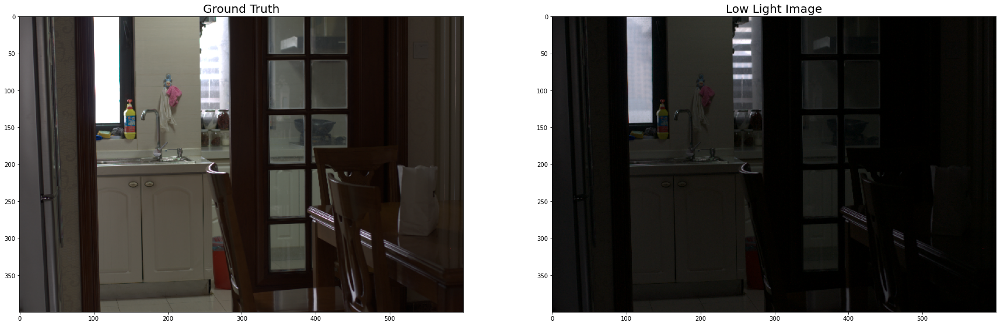

In [14]:
plt.figure(figsize=(30,30))
plt.subplot(1,2,1)
plt.title("Ground Truth",fontsize=20)
plt.imshow(high[3])

plt.subplot(1,2,2)
plt.title("Low Light Image",fontsize=20)
plt.imshow(low[3])

### Deep Neural Network Model
We employ a plain CNN of seven convolutional
layers with symmetrical concatenation. Each layer
consists of 32 convolutional kernels of size 3x3 and stride<br>
>1. Followed by the ReLU activation function. <br> <br>
2. The last convolutional layer is followed by the sigmoid activation function which produce parameter map of pixel range [0:1]



In [15]:
inputs = keras.Input(shape=(None, None, 3), name='img')
out1 = layers.Conv2D(32, (3,3), activation='relu', padding="same", strides=(1, 1))(inputs)
out2 = layers.Conv2D(32, (3,3), activation='relu', padding="same", strides=(1, 1))(out1)
out3 = layers.Conv2D(32, (3,3), activation='relu', padding="same", strides=(1, 1))(out2)
out4 = layers.Conv2D(32, (3,3), activation='relu', padding="same", strides=(1, 1))(out3)
in5 = layers.add([out3, out4])
out5 = layers.Conv2D(32, (3,3), activation='relu', padding="same", strides=(1, 1))(in5)
in6 = layers.add([out2, out5])
out6 = layers.Conv2D(32, (3,3), activation='relu', padding="same", strides=(1, 1))(in6)
in7 = layers.add([out1, out6])
outputs = layers.Conv2D(1, (3,3), activation='sigmoid', padding="same", strides=(1, 1))(in7)
model = keras.Model(inputs, outputs)

model.compile(optimizer="adam", loss='mean_squared_error')
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 3 896         img[0][0]                        
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 3 9248        conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, None, None, 3 9248        conv2d_1[0][0]                   
_______________________________________________________________________________________

### Training the model

---



In [18]:
def GenerateInputs(X,y):
    for i in range(len(X)):
        # Here we will reshape the input images from it's original size to (1,400,600)
        X_input = X[i].reshape(1,400,600,3)
        # Normalizing the image
        y_temp = y[i] / 255
        # Here we will reshape the enhanced images from it's original size to (1,400,600)
        y_input = y_temp.reshape(1,400,600,3)
        yield (X_input,y_input)
        
# Fitting our Model
model.fit(GenerateInputs(low,high), epochs=20, verbose=1, steps_per_epoch=24)

Epoch 1/3
24/24 [==============================] - 47s 2s/step - loss: 0.2911
Epoch 2/3
24/24 [==============================] - 48s 2s/step - loss: 0.2568
Epoch 3/3
24/24 [==============================] - 49s 2s/step - loss: 0.0801


### Saving the trained model

---



In [4]:
model.save(r'F:/projects/image_inhancement/ourModel.h5')

NameError: name 'model' is not defined

## Loading the Model
---

In [6]:
from keras.models import load_model
Model_Enhancer = load_model(r'F:/projects/image_inhancement/ML/ourModel.h5')

### **Loading** some low light images to test.


---

In [7]:
path = r'F:/projects/image_inhancement/dataset/eval15/low'
all_files = glob.glob(path + "/*")
x = list()
all_files.sort()
for fileName in all_files:
        img = imageio.imread(fileName)       
        x.append(img)      
X = np.array(x)

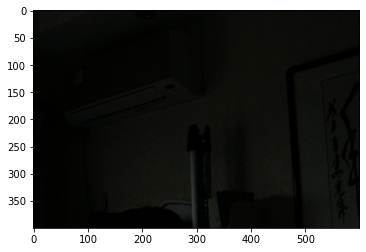

In [24]:
# 1 iteration only
img = X[3]
h, w,c = img.shape
test = Model_Enhancer.predict(img.reshape(1,h,w,c))
img = img/255
image = img + ((test[0,:,:,:] * img)*(1-img))
plt.imshow(image)

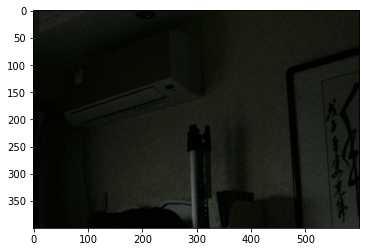

In [25]:
# 3 iteration
img = X[3]
h, w,c = img.shape
test = Model_Enhancer.predict(img.reshape(1,h,w,c))
img = img/255
image = img + ((test[0,:,:,:] * img)*(1-img))

test = Model_Enhancer.predict(image.reshape(1,h,w,c))
# img = img/255
image = image + ((test[0,:,:,:] * image)*(1-image))

test = Model_Enhancer.predict(image.reshape(1,h,w,c))
# img = img/255
image = image + ((test[0,:,:,:] * image)*(1-image))

plt.imshow(image)


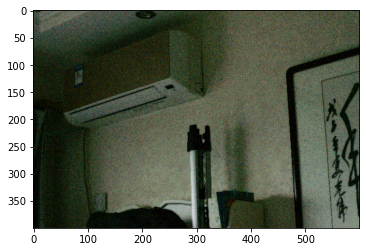

In [26]:
# 7 iteration

# 1st iteration
img = X[3]
h, w,c = img.shape
test = Model_Enhancer.predict(img.reshape(1,h,w,c))
img = img/255
image = img + ((test[0,:,:,:] * img)*(1-img))

# 2nd iteration
test = Model_Enhancer.predict(image.reshape(1,h,w,c))
image = image + ((test[0,:,:,:] * image)*(1-image))

# 3rd iteration
test = Model_Enhancer.predict(image.reshape(1,h,w,c))
image = image + ((test[0,:,:,:] * image)*(1-image))

# 4th iteration
test = Model_Enhancer.predict(image.reshape(1,h,w,c))
image = image + ((test[0,:,:,:] * image)*(1-image))

# 5th iteration
test = Model_Enhancer.predict(image.reshape(1,h,w,c))
image = image + ((test[0,:,:,:] * image)*(1-image))

# 6th iteration
test = Model_Enhancer.predict(image.reshape(1,h,w,c))
image = image + ((test[0,:,:,:] * image)*(1-image))

# 7th iteration
test = Model_Enhancer.predict(image.reshape(1,h,w,c))
image = image + ((test[0,:,:,:] * image)*(1-image))

plt.imshow(image)


### we converted the steps of iterations into recursive function. <br/>
**inputs:** <br/>
img: the low light image (**I**, **E**old) <br/>
index: no of iterations <br/>
flag: default = 1 


> *for more info. see README.md*


---


In [31]:
# Our Model may not give good results with only one iteration, So we will perform certain number of 
# iterations(greater than 1) to improve the results.

# img ==> low light image.
# index ==> Number of iterations.
# Purpose of using flag ==> To normalize the image for one time only. 
def Enhance(img, index, flag):
    if index == 0:
      return img

    elif flag == 1:
        # h, w, c are the height , width and no. of channel of image
        h, w, c = img.shape
        # predicting the image
        test = Model_Enhancer.predict(img.reshape(1, h, w, 3))
        temp = img / 255
        image = temp + ((test[0,:,:,:] * temp)*(1-temp))
        index = index - 1
        flag = 0
        return Enhance(image, index, flag)

    else:
        h, w, c = img.shape
        temp = Model_Enhancer.predict(img.reshape(1, h, w, 3))
        image = img + ((temp[0,:,:,:] * img)*(1-img))
        index = index - 1
        return Enhance(image, index, flag)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


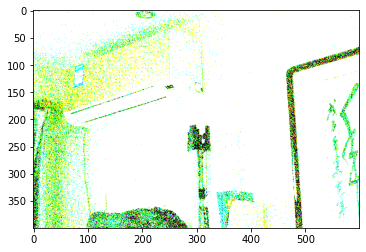

###**Examples**

---



In [28]:
path = r'F:/projects/image_inhancement/Test/me'
all_files = glob.glob(path + "/*")
x = list()
all_files.sort()
for fileName in all_files:
        img = imageio.imread(fileName)       
        x.append(img)      
X_ = np.array(x)

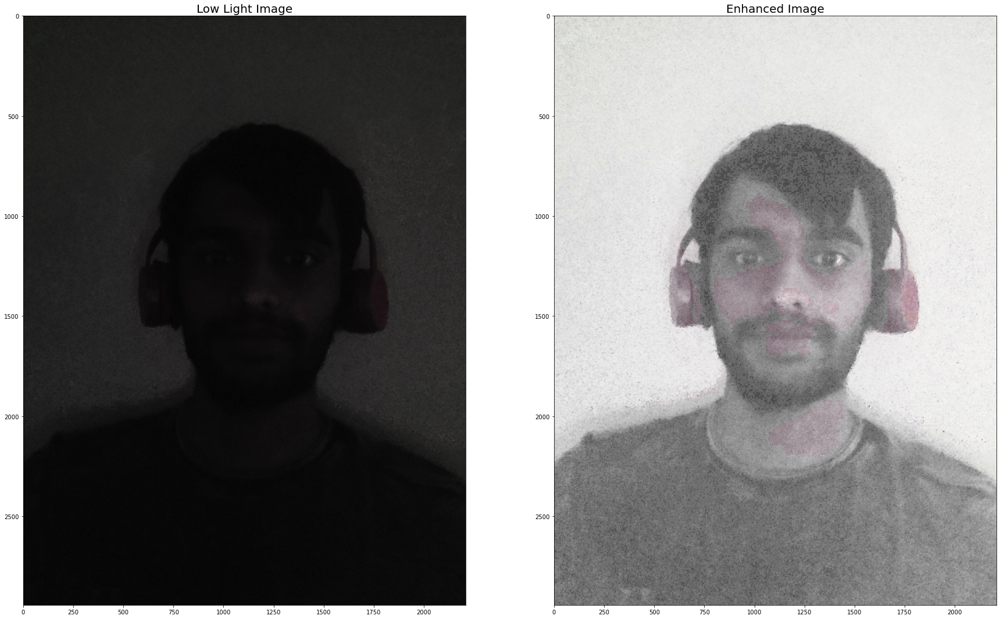

In [32]:
Image = X_[0]

plt.figure(figsize=(30,30))

plt.subplot(1,2,1)
plt.title("Low Light Image",fontsize=20)
plt.imshow(Image)

plt.subplot(1,2,2)
plt.title("Enhanced Image",fontsize=20)
plt.imshow(Enhance(Image, 8, 1))

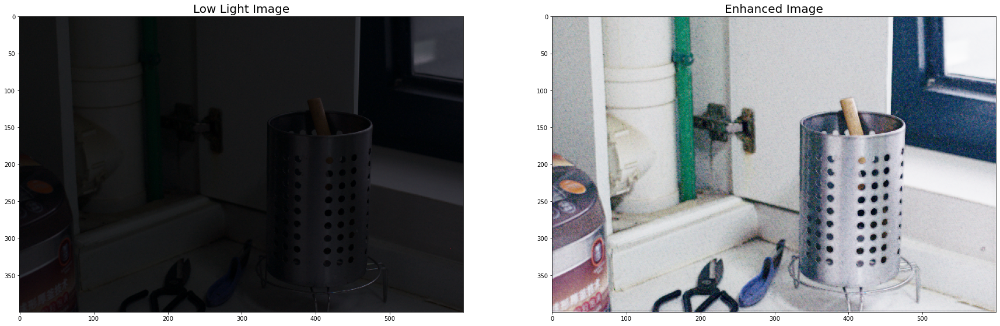

In [22]:
Image = X[1]

plt.figure(figsize=(30,30))

plt.subplot(1,2,1)
plt.title("Low Light Image",fontsize=20)
plt.imshow(Image)

plt.subplot(1,2,2)
plt.title("Enhanced Image",fontsize=20)
plt.imshow(Enhance(Image, 8, 1))

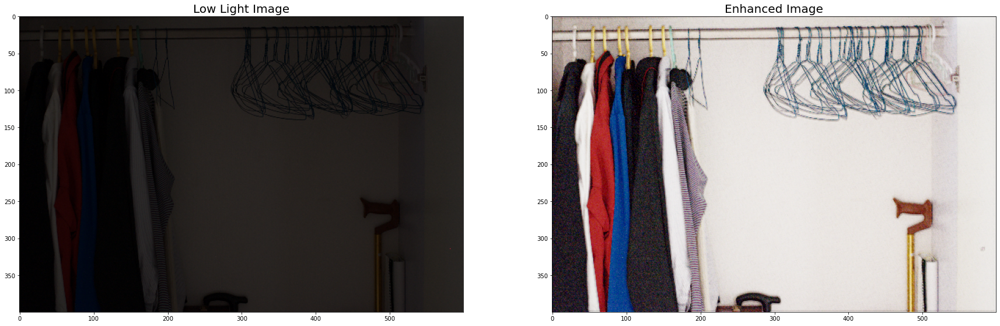

In [23]:
Image = X[2]

plt.figure(figsize=(30,30))

plt.subplot(1,2,1)
plt.title("Low Light Image",fontsize=20)
plt.imshow(Image)

plt.subplot(1,2,2)
plt.title("Enhanced Image",fontsize=20)
plt.imshow(Enhance(Image, 8, 1))

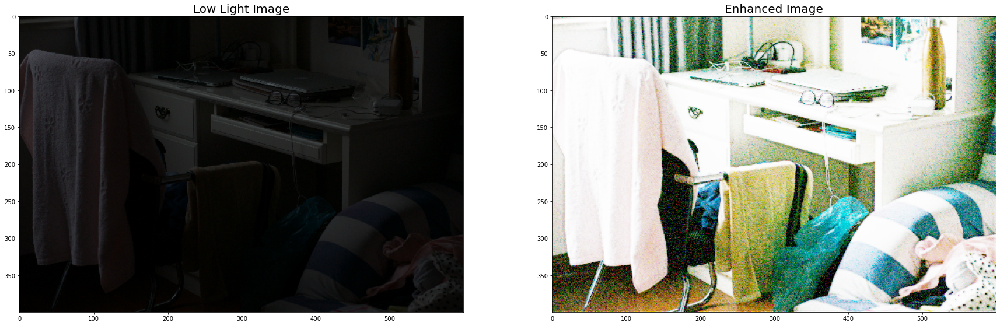

In [25]:
Image = X[6]

plt.figure(figsize=(30,30))

plt.subplot(1,2,1)
plt.title("Low Light Image",fontsize=20)
plt.imshow(Image)

plt.subplot(1,2,2)
plt.title("Enhanced Image",fontsize=20)
plt.imshow(Enhance(Image, 12, 1))

### **Extreme level** of low light images

---



In [0]:
path = r'/content/gdrive/My Drive/ImageProcessing/DataSet/test'
all_files = glob.glob(path + "/*")
x = list()
all_files.sort()
for fileName in all_files:      
        img = imageio.imread(fileName)           
        x.append(img)  
Z = np.array(x)

###**Examples**

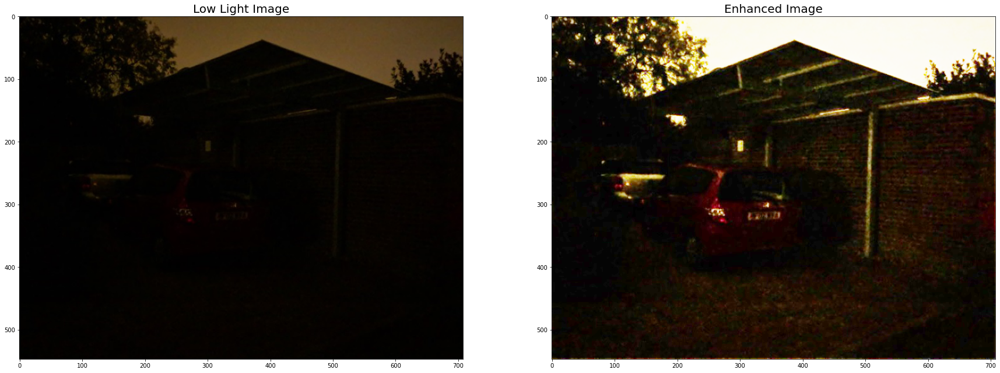

In [27]:
Image = Z[0]
plt.figure(figsize=(30,30))

plt.subplot(1,2,1)
plt.title("Low Light Image",fontsize=20)
plt.imshow(Image)

plt.subplot(1,2,2)
plt.title("Enhanced Image",fontsize=20)
plt.imshow(Enhance(Image, 12, 1))

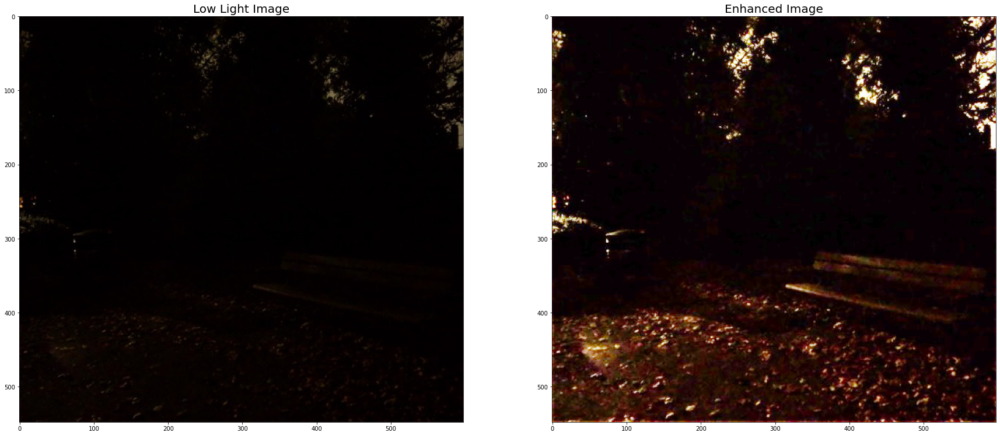

In [28]:
Image = Z[3]
plt.figure(figsize=(30,30))

plt.subplot(1,2,1)
plt.title("Low Light Image",fontsize=20)
plt.imshow(Image)

plt.subplot(1,2,2)
plt.title("Enhanced Image",fontsize=20)
plt.imshow(Enhance(Image, 12, 1))